In [7]:
!pip install gym stable-baselines3[extra] numpy scipy pandas scikit-learn matplotlib geopandas

In [13]:
import gym
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.callbacks import BaseCallback
from typing import Dict, Tuple
import torch
import pandas as pd
from sklearn.preprocessing import StandardScaler
from scipy import ndimage

class WildfireConfig:
    GRID_SIZE = (20, 20)
    EPISODE_LENGTH = 168
    NUM_STATIONS = 5
    INITIAL_RESOURCES = {
        'engines': 10,
        'crews': 5,
        'air_tankers': 2
    }

    FUEL_MODELS = {
        1: {'name': 'Short Grass', 'spread_rate': 0.3, 'fuel_load': 0.5},
        2: {'name': 'Timber', 'spread_rate': 0.15, 'fuel_load': 2.0},
        3: {'name': 'Shrub', 'spread_rate': 0.25, 'fuel_load': 1.5}
    }

    WEATHER_RANGES = {
        'temp': (15, 40),
        'rh': (10, 60),
        'wind_speed': (0, 30),
        'wind_dir': (0, 360)
    }

    REWARD_WEIGHTS = {
        'containment': 1.0,
        'resource_use': -0.1,
        'population_risk': -5.0,
        'environmental_impact': -2.0
    }

    TRAINING_STEPS = 250000
    BATCH_SIZE = 128
    POLICY_KWARGS = {
        'net_arch': [256, 256],
        'activation_fn': torch.nn.ReLU
    }

# Data Generation
class WildfireDataGenerator:
    def __init__(self, config):
        self.config = config
        self.scaler = StandardScaler()

    def generate_region_data(self) -> Dict:
        np.random.seed(42)

        terrain = np.random.choice(
            list(self.config.FUEL_MODELS.keys()),
            size=self.config.GRID_SIZE
        )

        population = np.exp(0.5 * np.random.randn(*self.config.GRID_SIZE))
        population = (population / population.max()) * 1000

        env_sensitivity = np.zeros(self.config.GRID_SIZE)
        env_sensitivity[5:10, 5:10] = 1
        env_sensitivity[15:18, 12:16] = 2

        stations = []
        for i in range(self.config.NUM_STATIONS):
            station = {
                'id': f"STN_{i+1:03d}",
                'location': (
                    np.random.randint(0, self.config.GRID_SIZE[0]),
                    np.random.randint(0, self.config.GRID_SIZE[1])
                ),
                'resources': self.config.INITIAL_RESOURCES.copy()
            }
            stations.append(station)

        return {
            'terrain': terrain,
            'population': population,
            'env_sensitivity': env_sensitivity,
            'stations': stations
        }

    def generate_weather_sequence(self, length: int) -> pd.DataFrame:
        time_steps = pd.date_range(start="2023-07-01", periods=length, freq="h")

        weather = pd.DataFrame(index=time_steps)
        weather['temp'] = np.sin(np.linspace(0, 2*np.pi, length)) * 5 + 25
        weather['rh'] = np.cos(np.linspace(0, 2*np.pi, length)) * 10 + 40
        weather['wind_speed'] = np.abs(np.random.normal(10, 5, length))
        weather['wind_dir'] = np.random.uniform(0, 360, length)

        return self.scaler.fit_transform(weather)

class EnhancedWildfireEnv(gym.Env):
    metadata = {'render.modes': ['human', 'rgb_array']}

    def __init__(self, config: WildfireConfig, region_data: Dict):
        super().__init__()
        self.config = config
        self.region_data = region_data
        self.weather_gen = WildfireDataGenerator(config)

        self.observation_space = spaces.Dict({
            'fire_map': spaces.Box(0, 1, shape=config.GRID_SIZE),
            'resource_map': spaces.Box(0, 1, shape=(config.NUM_STATIONS, 3)),
            'weather': spaces.Box(-2, 2, shape=(4,)),
            'risk_map': spaces.Box(0, 1, shape=config.GRID_SIZE)
        })

        self.action_space = spaces.MultiDiscrete([
            config.NUM_STATIONS,
            3,
            config.GRID_SIZE[0],
            config.GRID_SIZE[1]
        ])

        self.reset()

    def reset(self):
        self.fire_map = np.zeros(self.config.GRID_SIZE)
        self.ignition_point = (
            np.random.randint(0, self.config.GRID_SIZE[0]),
            np.random.randint(0, self.config.GRID_SIZE[1])
        )
        self.fire_map[self.ignition_point] = 1

        self.resources = [s['resources'].copy() for s in self.region_data['stations']]
        self.deployment_map = np.zeros((*self.config.GRID_SIZE, 3))

        self.weather = self.weather_gen.generate_weather_sequence(self.config.EPISODE_LENGTH)
        self.current_step = 0

        return self._get_obs()

    def _get_obs(self):
        return {
            'fire_map': self.fire_map.copy(),
            'resource_map': np.array([
                [s['engines'], s['crews'], s['air_tankers']]
                for s in self.resources
            ]),
            'weather': self.weather[self.current_step],
            'risk_map': self._calculate_risk_map()
        }

    def _calculate_risk_map(self):
        fire_intensity = ndimage.gaussian_filter(self.fire_map, sigma=1.5)
        population_risk = self.region_data['population'] / 1000
        env_risk = self.region_data['env_sensitivity'] / 2.0
        return 0.4*fire_intensity + 0.4*population_risk + 0.2*env_risk

    def _fire_spread(self):
        fuel_coeff = np.vectorize(lambda x: self.config.FUEL_MODELS[x]['spread_rate'])(self.region_data['terrain'])
        wind_vec = self._calculate_wind_effect()

        spread_prob = 0.1 + 0.3*fuel_coeff + 0.6*wind_vec
        spread_mask = np.random.rand(*self.config.GRID_SIZE) < spread_prob

        new_fires = ndimage.binary_dilation(self.fire_map) & spread_mask
        self.fire_map = np.clip(self.fire_map + new_fires, 0, 1)

    def _calculate_wind_effect(self):
        wind_dir = np.deg2rad(self.weather[self.current_step, 3])
        wind_speed = self.weather[self.current_step, 2]

        dx = np.cos(wind_dir) * wind_speed / 30
        dy = np.sin(wind_dir) * wind_speed / 30

        x, y = np.meshgrid(
            np.arange(self.config.GRID_SIZE[1]),
            np.arange(self.config.GRID_SIZE[0])
        )
        return np.exp(-(x*dx + y*dy))

    def step(self, action):
        station_id, action_type, target_x, target_y = action
        station = self.resources[station_id]
        success = False

        if self._validate_action(station_id, action_type, target_x, target_y):
            effectiveness = self._apply_resource(action_type, (target_x, target_y))
            success = effectiveness > 0

            resource_type = ['engines', 'crews', 'air_tankers'][action_type]
            station[resource_type] -= 1

        self._fire_spread()

        reward = self._calculate_reward(success, action_type)

        self.current_step += 1
        done = self.current_step >= self.config.EPISODE_LENGTH or np.mean(self.fire_map) > 0.9

        return self._get_obs(), reward, done, {}

    def _validate_action(self, station_id, action_type, x, y):
        resource_type = ['engines', 'crews', 'air_tankers'][action_type]
        if self.resources[station_id][resource_type] < 1:
            return False

        if not (0 <= x < self.config.GRID_SIZE[0] and 0 <= y < self.config.GRID_SIZE[1]):
            return False

        return True

    def _apply_resource(self, action_type, location):
        x, y = location
        base_effectiveness = [0.4, 0.6, 0.8][action_type]
        distance_penalty = self._calculate_distance_penalty(location)

        effectiveness = base_effectiveness * (1 - distance_penalty)
        self.fire_map[x,y] *= (1 - effectiveness)

        return effectiveness

    def _calculate_distance_penalty(self, location):
        station_locs = [s['location'] for s in self.region_data['stations']]
        distances = [np.linalg.norm(np.array(loc)-np.array(location))
                    for loc in station_locs]
        return min(distances) / max(self.config.GRID_SIZE)

    def _calculate_reward(self, action_success, action_type):
        contained_area = 1 - np.mean(self.fire_map)
        containment_reward = self.config.REWARD_WEIGHTS['containment'] * contained_area

        resource_penalty = self.config.REWARD_WEIGHTS['resource_use'] * (action_type + 1)

        population_risk = np.sum(self.region_data['population'] * self.fire_map)
        env_risk = np.sum(self.region_data['env_sensitivity'] * self.fire_map)
        risk_penalty = (
            self.config.REWARD_WEIGHTS['population_risk'] * population_risk +
            self.config.REWARD_WEIGHTS['environmental_impact'] * env_risk
        )

        success_bonus = 0.5 * action_success

        return containment_reward + resource_penalty + risk_penalty + success_bonus

    def render(self, mode='human'):
        plt.figure(figsize=(10, 8))

        plt.imshow(self._calculate_risk_map(), cmap='YlOrRd', alpha=0.6)
        plt.imshow(self.fire_map, cmap='Reds', alpha=0.4)

        stations = self.region_data['stations']
        for s in stations:
            plt.scatter(s['location'][1], s['location'][0],
                       c='blue', s=100, marker='^')

        plt.title(f"Wildfire State - Step {self.current_step}")
        plt.colorbar(label='Risk Level')
        plt.tight_layout()

        if mode == 'human':
            plt.show()
        else:
            fig = plt.gcf()
            fig.canvas.draw()
            img = np.array(fig.canvas.renderer._renderer)
            plt.close()
            return img[..., :3]

class TrainingCallback(BaseCallback):
    def __init__(self, config, verbose=0):
        super().__init__(verbose)
        self.config = config
        self.episode_rewards = []

    def _on_step(self) -> bool:
        return True

    def _on_rollout_end(self) -> None:
        rewards = self.model.rollout_buffer.rewards.copy()
        self.episode_rewards.append(np.sum(rewards))

        if len(self.episode_rewards) % 10 == 0:
            avg_reward = np.mean(self.episode_rewards[-10:])
            self.logger.record('train/avg_reward', avg_reward)

            total_initial = (
                self.config.INITIAL_RESOURCES['engines'] +
                self.config.INITIAL_RESOURCES['crews'] +
                self.config.INITIAL_RESOURCES['air_tankers']
            )
            current_resources = sum(
                r for station in self.training_env.envs[0].resources
                for r in station.values()
            )
            resource_use = total_initial - current_resources

            self.logger.record('train/resource_use', resource_use)
            self.logger.record('train/fire_coverage',
                             np.mean(self.training_env.envs[0].fire_map))

def train_fire_model():
    config = WildfireConfig()
    data_gen = WildfireDataGenerator(config)
    region_data = data_gen.generate_region_data()

    env = DummyVecEnv([lambda: EnhancedWildfireEnv(config, region_data)])

    model = PPO(
        "MultiInputPolicy",
        env,
        verbose=1,
        batch_size=config.BATCH_SIZE,
        policy_kwargs=config.POLICY_KWARGS,
        tensorboard_log="./tb_logs/"
    )

    callback = TrainingCallback(config)
    model.learn(
        total_timesteps=config.TRAINING_STEPS,
        callback=callback,
        tb_log_name="wildfire_v2"
    )

    model.save("enhanced_fire_model")
    return model

class FireSimulationRunner:
    def __init__(self, model_path, config):
        self.model = PPO.load(model_path)
        self.config = config
        self.data_gen = WildfireDataGenerator(config)

    def run_simulation(self, num_episodes=5):
        results = []
        for ep in range(num_episodes):
            region_data = self.data_gen.generate_region_data()
            env = EnhancedWildfireEnv(self.config, region_data)

            obs = env.reset()
            done = False
            total_reward = 0
            frames = []

            while not done:
                action, _ = self.model.predict(obs)
                obs, reward, done, _ = env.step(action)
                total_reward += reward
                frames.append(env.render(mode='rgb_array'))

            results.append({
                'episode': ep,
                'total_reward': total_reward,
                'final_fire_size': np.sum(env.fire_map),
                'resources_used': (
                    sum(self.config.INITIAL_RESOURCES.values()) -
                    sum(r for station in env.resources for r in station.values())
                ),
                'animation': frames
            })

        return results

if __name__ == "__main__":
    trained_model = train_fire_model()

    simulator = FireSimulationRunner("enhanced_fire_model", WildfireConfig())
    results = simulator.run_simulation(3)

    for i, result in enumerate(results):
        print(f"Episode {i+1}:")
        print(f"  Total Reward: {result['total_reward']:.2f}")
        print(f"  Final Fire Size: {result['final_fire_size']} cells")
        print(f"  Resources Used: {result['resources_used']} units")

Using cpu device
Logging to ./tb_logs/wildfire_v2_5


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 339  |
|    iterations      | 1    |
|    time_elapsed    | 6    |
|    total_timesteps | 2048 |
-----------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 263       |
|    iterations           | 2         |
|    time_elapsed         | 15        |
|    total_timesteps      | 4096      |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -8.7      |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0003    |
|    loss                 | 2.51e+12  |
|    n_updates            | 10        |
|    policy_gradient_loss | -3.07e-06 |
|    value_loss           | 4.96e+12  |
---------------------------------------
---------------------------------------
| time/                   |   

/usr/local/lib/python3.11/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(


Episode 1:
  Total Reward: -3965723.14
  Final Fire Size: 367.67211102550925 cells
  Resources Used: -50 units
Episode 2:
  Total Reward: -3966845.02
  Final Fire Size: 368.0 cells
  Resources Used: -52 units
Episode 3:
  Total Reward: -3966508.67
  Final Fire Size: 368.0 cells
  Resources Used: -49 units


In [16]:
%load_ext tensorboard
%tensorboard --logdir tb_logs/

<IPython.core.display.Javascript object>

/usr/local/lib/python3.11/dist-packages/imageio/plugins/pillow.py:409: DeprecationWarning: The keyword `fps` is no longer supported. Use `duration`(in ms) instead, e.g. `fps=50` == `duration=20` (1000 * 1/50).
  warnings.warn(


Displaying GIF for Episode 1:


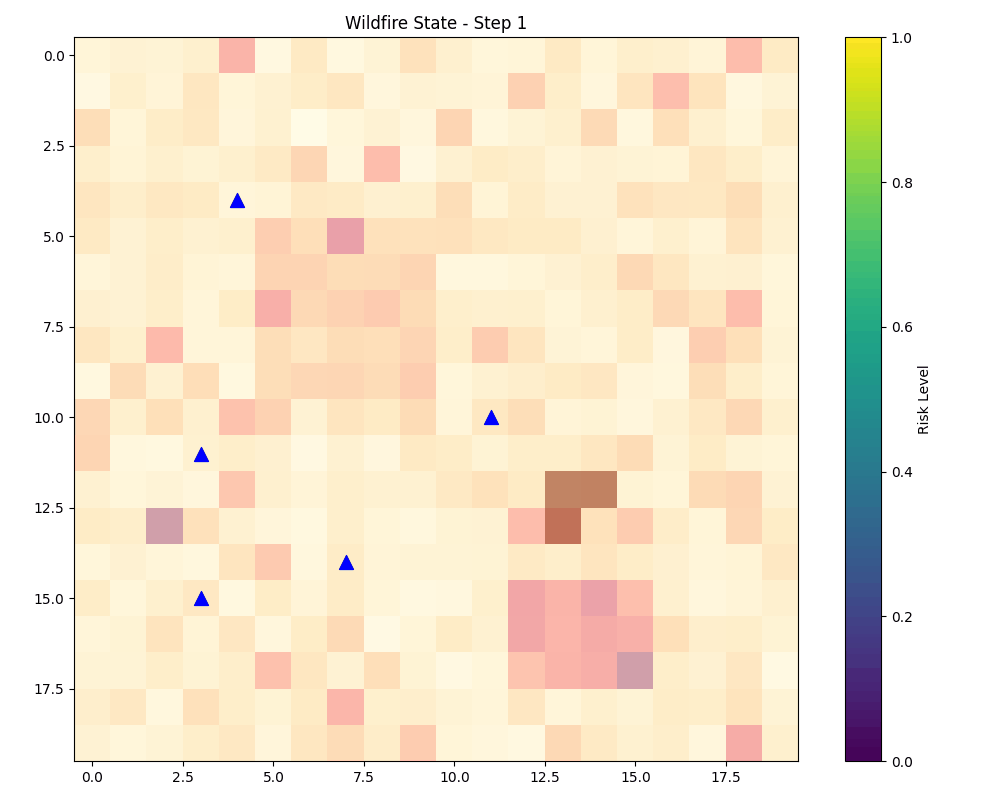

Displaying GIF for Episode 2:


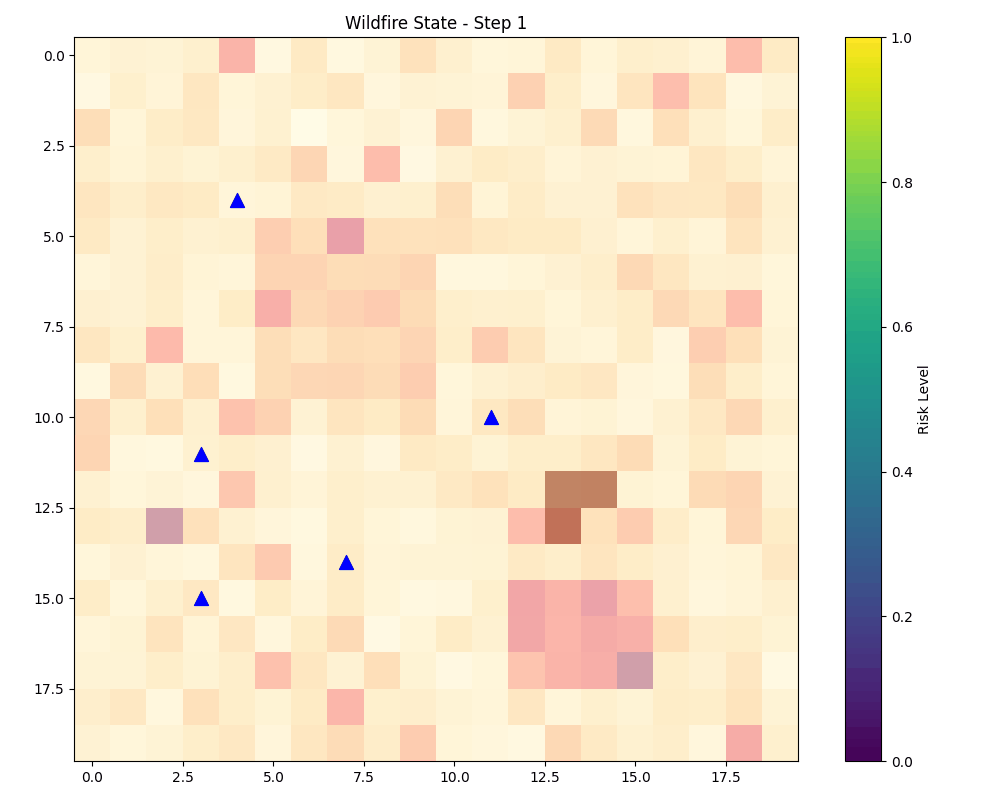

Displaying GIF for Episode 3:


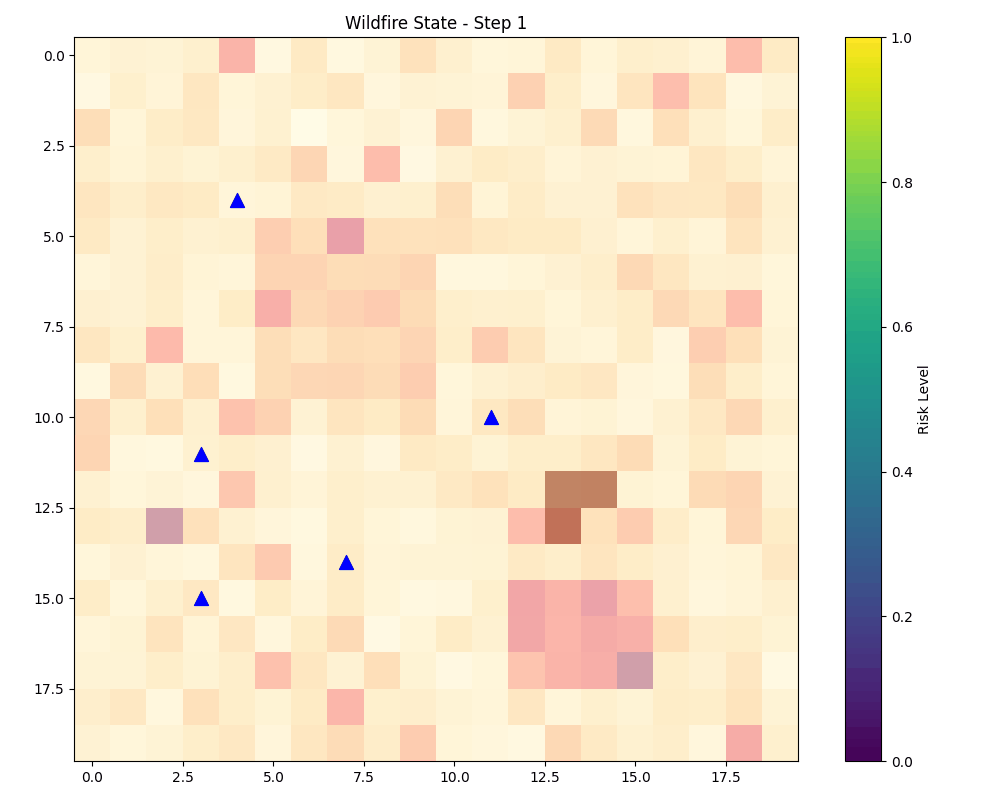

In [18]:
import imageio
from IPython.display import Image, display

for i, res in enumerate(results):
    frames = res['animation']
    gif_filename = f"fire_simulation_ep_{i+1}.gif"
    imageio.mimsave(gif_filename, frames, fps=5)
    print(f"Displaying GIF for Episode {i+1}:")
    display(Image(filename=gif_filename))


Episode 1:


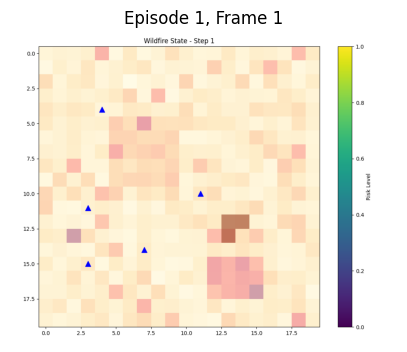

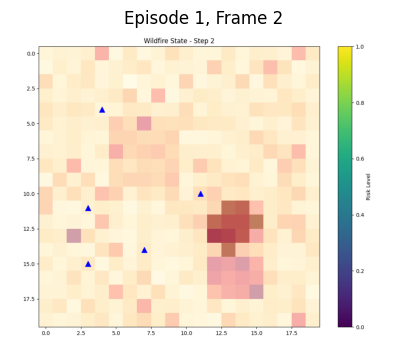

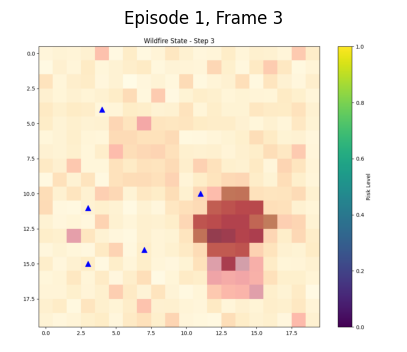

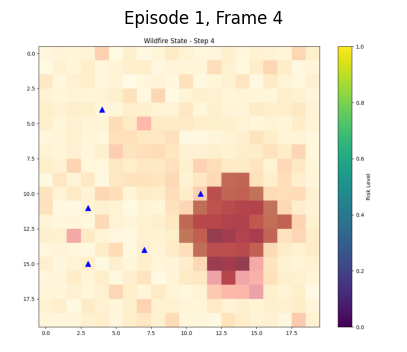

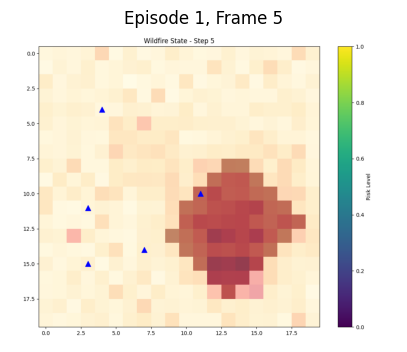

...

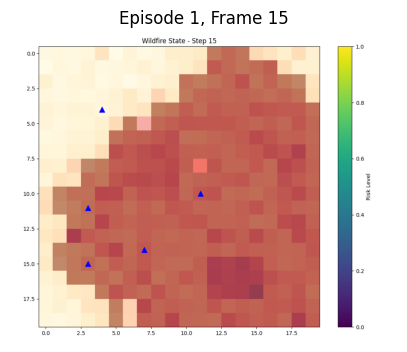

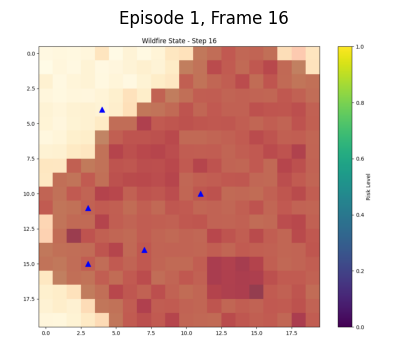

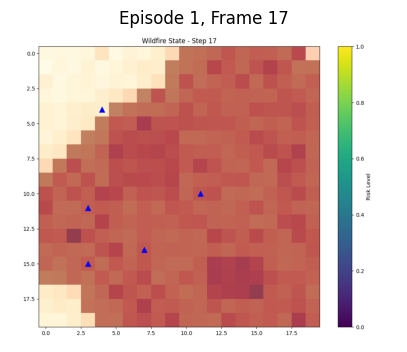

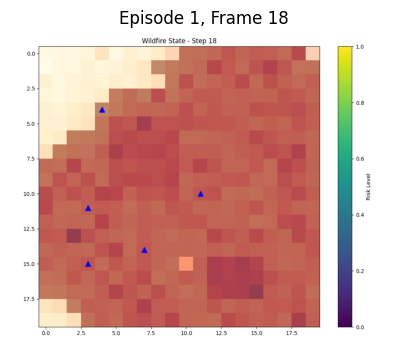

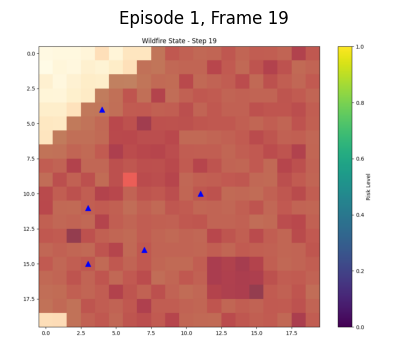


Episode 2:


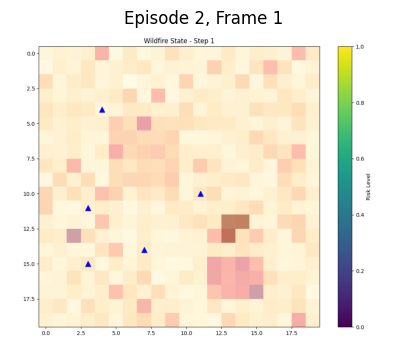

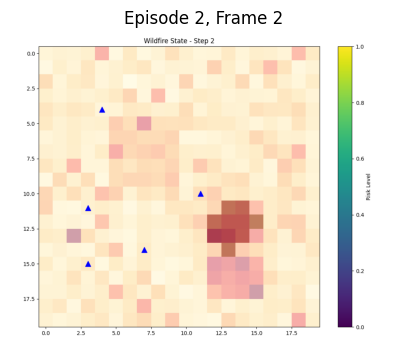

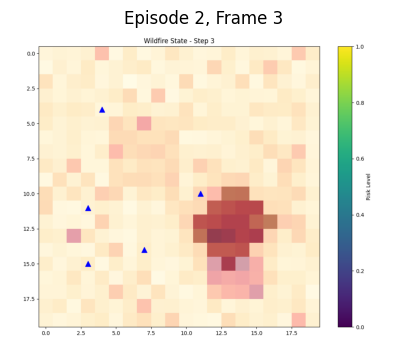

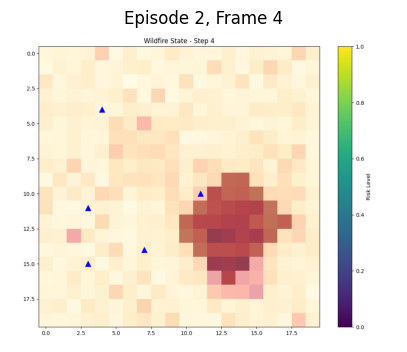

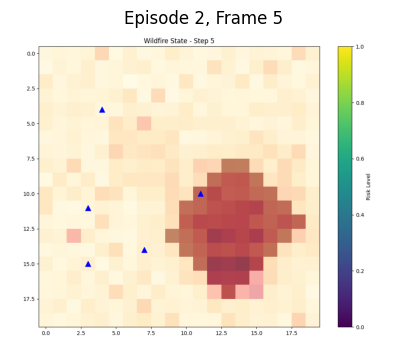

...

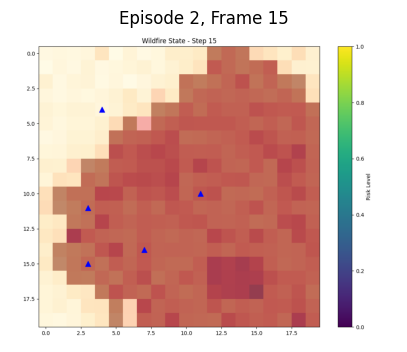

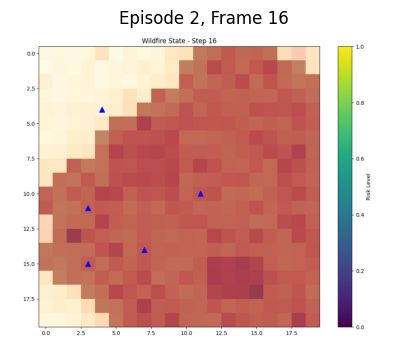

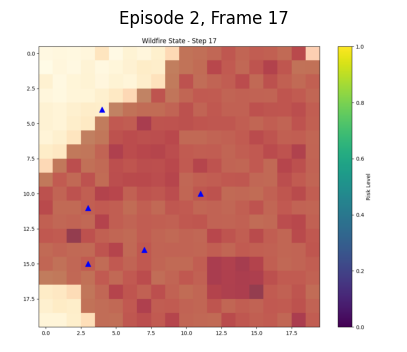

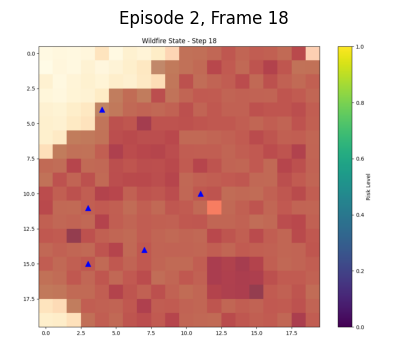

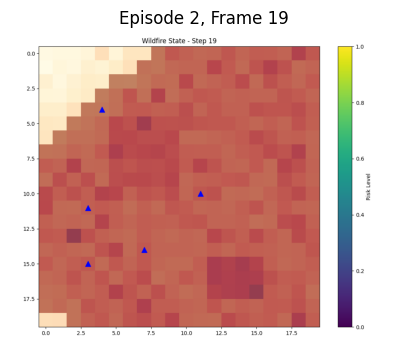


Episode 3:


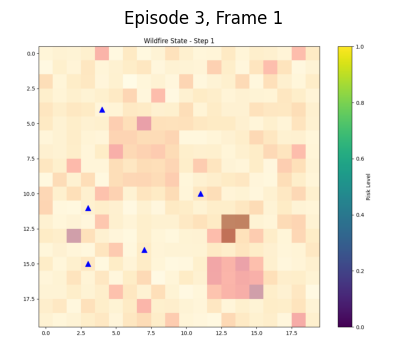

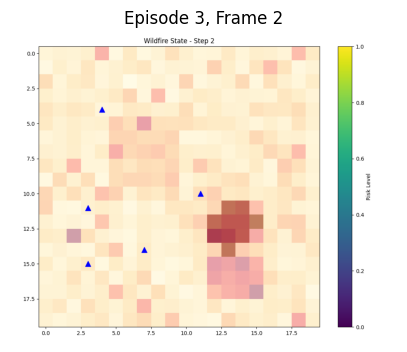

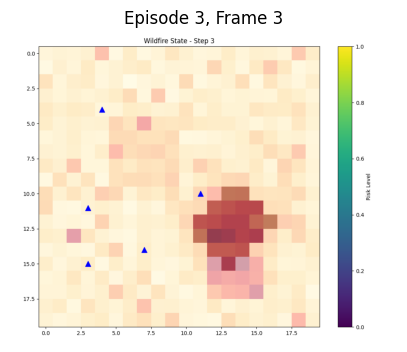

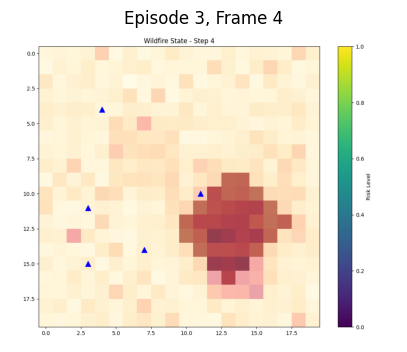

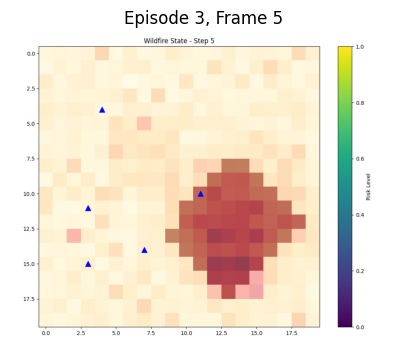

...

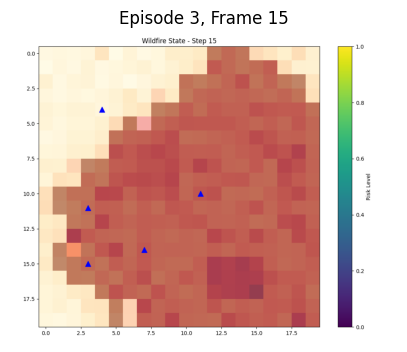

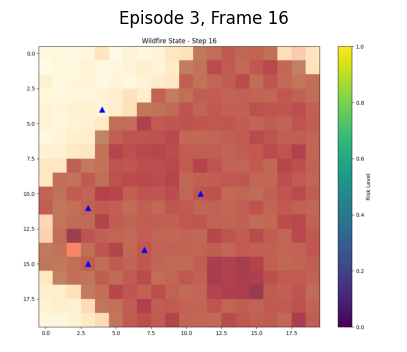

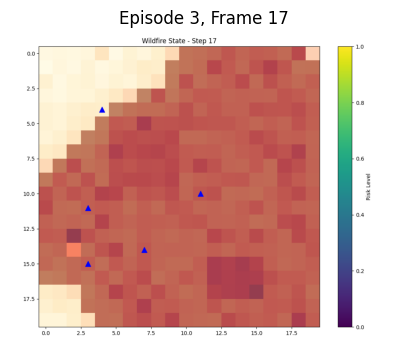

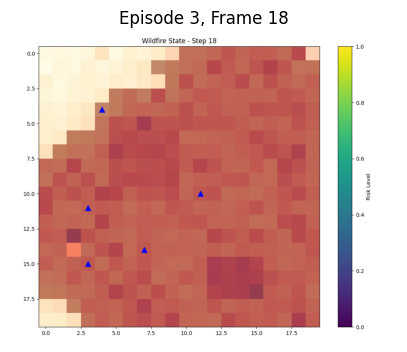

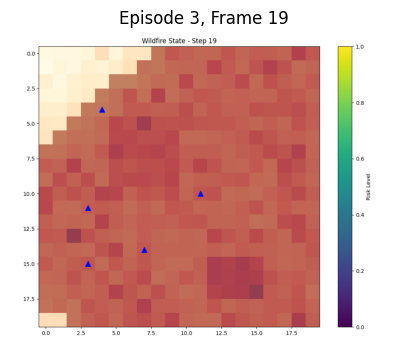

In [19]:
import matplotlib.pyplot as plt

for i, res in enumerate(results):
    print(f"\nEpisode {i+1}:")
    frames = res['animation']
    for j in range(len(frames)):
        plt.figure(figsize=(5,5))
        plt.imshow(frames[j])
        plt.title(f"Episode {i+1}, Frame {j+1}")
        plt.axis('off')
        plt.show()

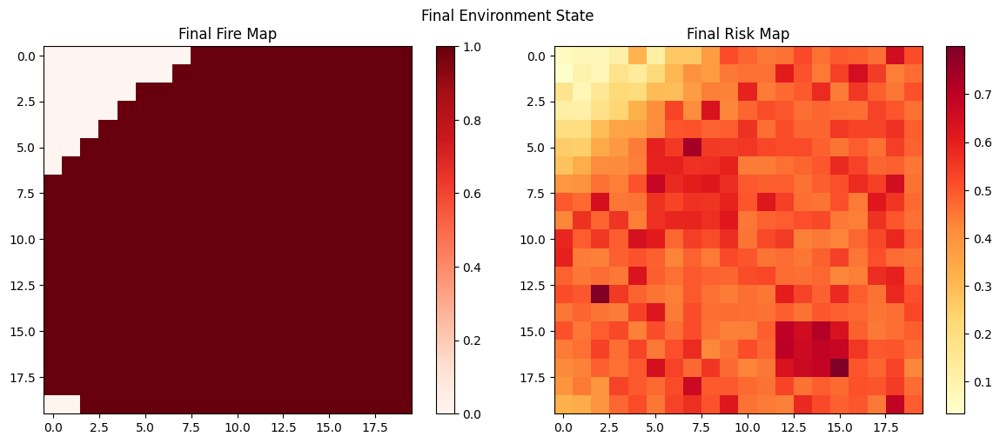

In [20]:
config_instance = WildfireConfig()
data_gen = WildfireDataGenerator(config_instance)
region_data = data_gen.generate_region_data()
env_manual = EnhancedWildfireEnv(config_instance, region_data)

obs = env_manual.reset()
done = False
while not done:
    action, _ = trained_model.predict(obs, deterministic=True)
    obs, reward, done, _ = env_manual.step(action)

fire_map = env_manual.fire_map
risk_map = env_manual._calculate_risk_map()

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(fire_map, cmap='Reds')
plt.title("Final Fire Map")
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(risk_map, cmap='YlOrRd')
plt.title("Final Risk Map")
plt.colorbar()
plt.suptitle("Final Environment State")
plt.tight_layout()
plt.show()